In [1]:
!pip install astroquery
!pip install ydata_profiling
!pip install --upgrade openai

In [2]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd
import numpy as np
!pip install keras
!pip install tensorflow
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
import os                           # manage local files in your Compute containers
from astroquery.sdss import SDSS
from astroquery.simbad import Simbad
# Python standard-libraries to download data from the web
from urllib.parse import urlencode
from urllib.request import urlretrieve
#only here to display images
from IPython.display import Image
#
from astropy.io import ascii
from astropy import coordinates as coords
from astropy.coordinates import SkyCoord
from astropy.io import fits
from astropy.constants import c # useful constants
from astropy import units as u # useful for unit conversions
from matplotlib.image import imread
# do *not* show python warnings
import warnings
warnings.filterwarnings('ignore')
print('Settings applied')
# Importamos ProfileReport de la librería ydata_profiling
from ydata_profiling import ProfileReport

2024-07-26 08:30:01.801370: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-26 08:30:01.859322: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-26 08:30:01.876412: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-26 08:30:01.976779: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-26 08:30:03.172381: W tensorflow/compiler/tf2

Settings applied


In [3]:
# Find objects in the Sloan Digital Sky Survey's Data Release 18.

query = 'SELECT TOP 100000 '
query += 'z.objid, z.nvote, z.spiral, z.elliptical, z.uncertain, '
query += 'p.ra, p.dec, p.petror90_r, p.expAB_r, p.dered_u as u, '
query += 'p.dered_g as g, p.dered_r as r, p.dered_i as i '
query += 'FROM ZooSpec as z JOIN galaxy AS p ON z.objid = p.objid '
query += 'WHERE nvote >= 10 '
query += 'AND p.petror90_r > 10'
query += 'AND p.ra between 100 and 250 '
query += 'AND p.dec between -10 and 10 '

print(query) # useful for debugging

# send query to SDSS
all_gals = SDSS.query_sql(query, data_release=18)

# Conver to Pandas DF
all_gals = all_gals.to_pandas()

SELECT TOP 100000 z.objid, z.nvote, z.spiral, z.elliptical, z.uncertain, p.ra, p.dec, p.petror90_r, p.expAB_r, p.dered_u as u, p.dered_g as g, p.dered_r as r, p.dered_i as i FROM ZooSpec as z JOIN galaxy AS p ON z.objid = p.objid WHERE nvote >= 10 AND p.petror90_r > 10AND p.ra between 100 and 250 AND p.dec between -10 and 10 


In [4]:
all_gals

,objid,nvote,spiral,elliptical,uncertain,ra,dec,petror90_r,expAB_r,u,g,r,i
0,1237648673992671592,40,0,1,0,237.945144,-0.105170,13.36310,0.923567,17.60677,15.52986,14.62853,14.21786
1,1237648674529476946,52,0,1,0,237.798299,0.319624,11.13560,0.729229,18.60427,16.59233,15.64660,15.23424
2,1237648674529476993,47,1,0,0,237.811418,0.293006,10.64184,0.519332,17.71102,16.29218,15.63511,15.30861
3,1237648675066675556,33,1,0,0,238.489210,0.688090,10.56850,0.542142,17.14548,15.78218,15.14973,14.77505
4,1237648704063340840,65,1,0,0,236.173157,-0.253611,14.08793,0.193187,17.85771,16.55570,16.00226,15.70330
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12282,1237671764787200137,36,0,0,1,190.830530,1.550713,10.59094,0.971643,18.31974,16.78312,15.99764,15.62374
12283,1237671764787331325,27,1,0,0,190.889807,1.810234,15.64854,0.349454,17.80250,16.02506,15.23510,14.80043
12284,1237671765324333339,43,1,0,0,190.436682,2.089549,10.92307,0.285187,19.20432,18.03366,17.58185,17.37344
12285,1237671765324595358,57,0,1,0,190.464426,2.738842,10.64187,0.559680,18.62956,16.47706,15.51064,15.11258


Text(0.5, 1.0, 'Galaxy positions')

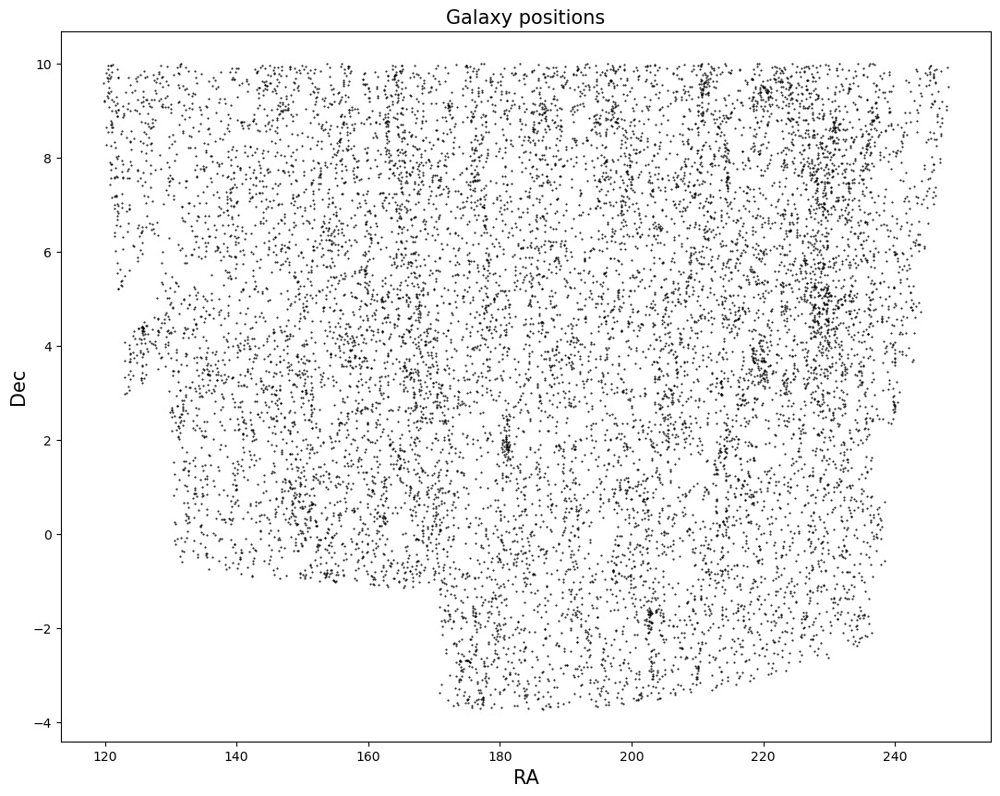

In [5]:
plt.figure(figsize=(13,10))
plt.scatter(all_gals['ra'], all_gals['dec'], marker='.', color='black',s=1)
plt.xlabel('RA', fontsize=15); plt.ylabel('Dec', fontsize=15)
plt.title('Galaxy positions', fontsize=15)

In [6]:
#Selecting galaxies by type
elliptical_gals_index = np.where(all_gals['elliptical'] == 1)[0]
spiral_gals_index = np.where(all_gals['spiral'] == 1)[0]
uncertain_gals_index = np.where(all_gals['uncertain'] == 1)[0]

#Selecting galaxies by type
elliptical_gals = all_gals.iloc[elliptical_gals_index]
spiral_gals = all_gals.iloc[spiral_gals_index]
uncertain_gals = all_gals.iloc[uncertain_gals_index]

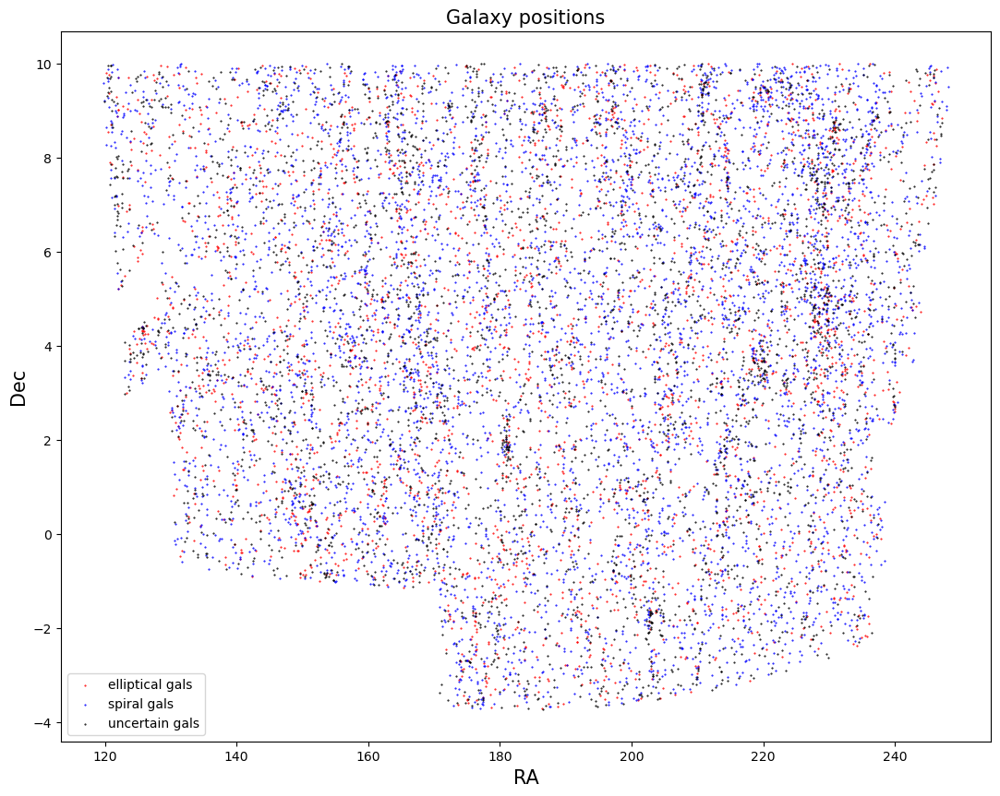

In [7]:
plt.figure(figsize=(13,10))

plt.scatter(elliptical_gals['ra'], elliptical_gals['dec'], marker='.', color='red',s=1, label="elliptical gals")
plt.scatter(spiral_gals['ra'], spiral_gals['dec'], marker='.', color='blue',s=1, label="spiral gals")
plt.scatter(uncertain_gals['ra'], uncertain_gals['dec'], marker='.', color='black',s=1, label="uncertain gals")

plt.legend()
plt.xlabel('RA', fontsize=15); plt.ylabel('Dec', fontsize=15)
plt.title('Galaxy positions', fontsize=15)

plt.show()

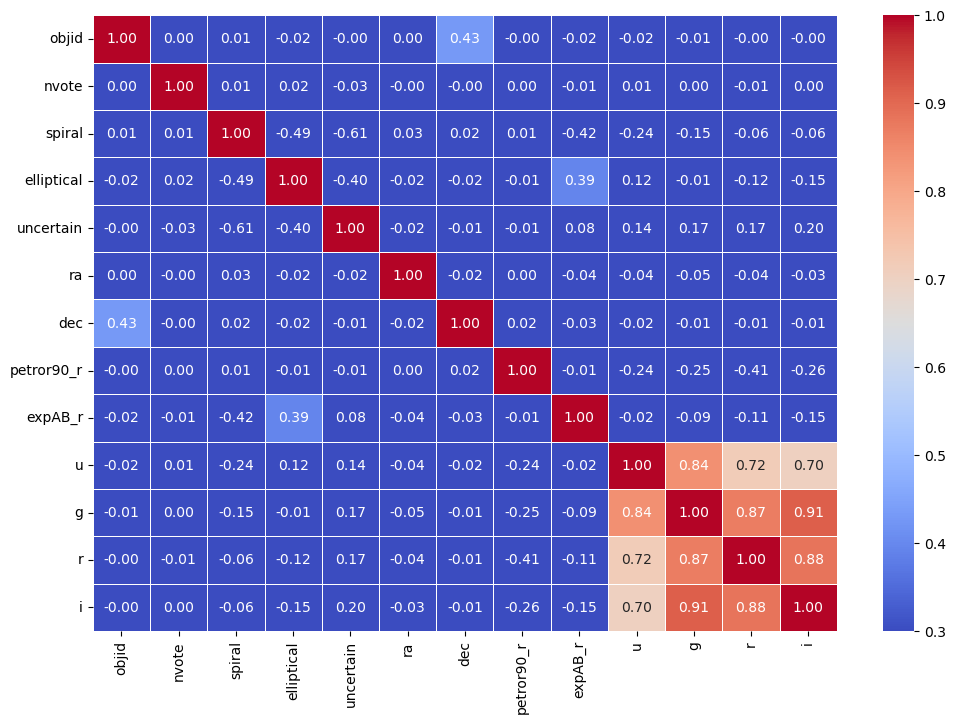

In [8]:
# Let's make a correlation matrix
correlation = all_gals.corr()
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(correlation, annot=True, linewidths=0.5, linecolor="white",vmin=0.3, cmap="coolwarm",fmt='.2f')

In [9]:
# Generamos el reporte de perfilado de datos
perfil_datos = ProfileReport(all_gals, title='Reporte de Perfilado de Datos de Galaxias', explorative=True)

In [10]:
perfil_datos.to_file('reporte_perfilado_datos_galaxias.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
perfil_datos

In [12]:
#Adding a u-g colum

all_gals['u-g'] = all_gals['u'] - all_gals['g']

Text(0.5, 1.0, 'Distribution of u-g color')

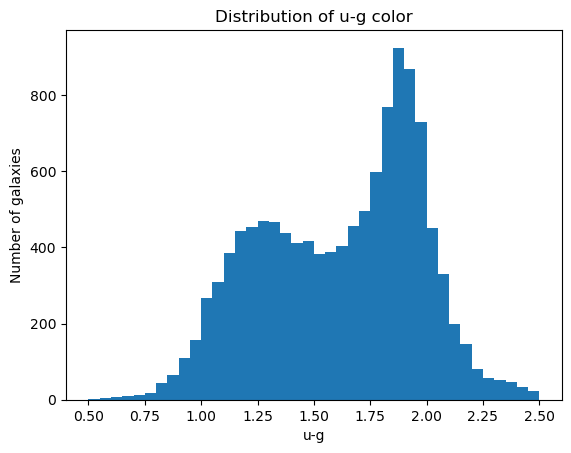

In [13]:
plt.hist(all_gals['u-g'], bins=40, range=(0.5,2.5))
plt.xlabel('u-g')
plt.ylabel('Number of galaxies')
plt.title('Distribution of u-g color')

Text(0.5, 1.0, 'u-g color against r magnitude for all galaxies')

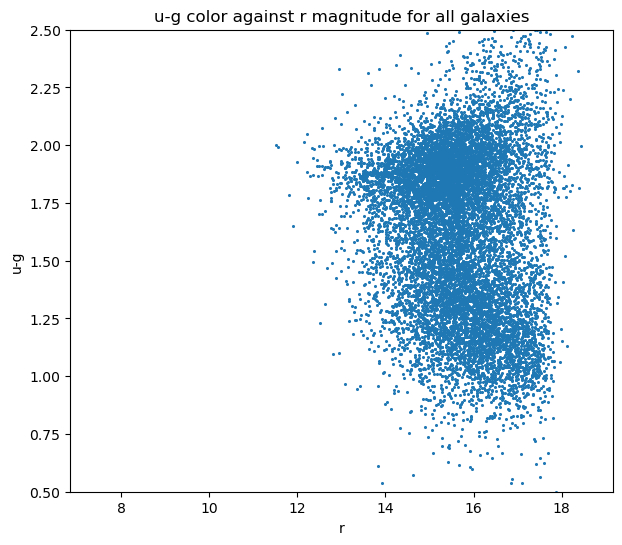

In [14]:
fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot(1,1,1)
plt.scatter(all_gals['r'], all_gals['u']-all_gals['g'], s=1.5)
plt.xlabel('r')
plt.ylabel('u-g')
ax.set_ylim(0.50,2.50)
#ax.invert_xaxis()
plt.title('u-g color against r magnitude for all galaxies')


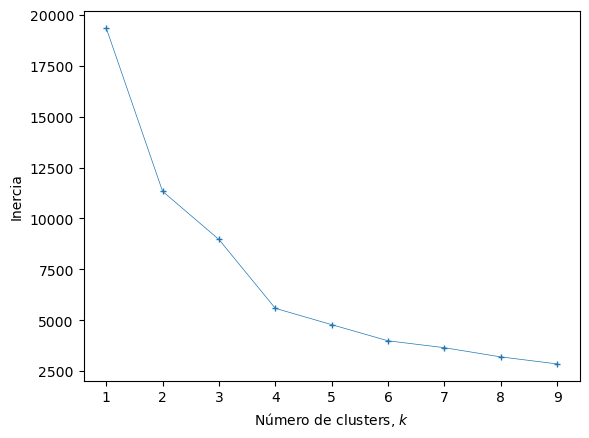

In [15]:
from sklearn.cluster import KMeans

rs = all_gals[['r', 'u-g']]
# Definimos un rango de números del 1 al 9 para representar los posibles números de clusters
ks = range(1,10)

# Creamos una lista vacía para almacenar los valores de inercia para cada número de clusters
inercias = []

# Iteramos sobre cada número en el rango ks
for k in ks:
    # Creamos una instancia del algoritmo KMeans con k clusters
    model = KMeans(n_clusters=k)

    # Ajustamos el modelo a los datos contenidos en income_spending
    model.fit(rs)

    # Añadimos el valor de la inercia del modelo a la lista inercias
    inercias.append(model.inertia_)

# Graficamos los valores de inercia en función del número de clusters
plt.plot(ks, inercias, marker='+', linewidth=0.5, markersize=5)

# Establecemos la etiqueta del eje x
plt.xlabel('Número de clusters, $k$')

# Establecemos la etiqueta del eje y
plt.ylabel('Inercia')

# Establecemos las marcas del eje x para que coincidan con los números de clusters
plt.xticks(ks)

# Mostramos el gráfico
plt.show()

In [16]:
model_kmeans = KMeans(n_clusters=2)

model_kmeans.fit(rs)

KMeans(n_clusters=2)

In [17]:
rs['cluster'] = model_kmeans.labels_
rs.head(10)

,r,u-g,cluster
0,14.62853,2.07691,1
1,15.64660,2.01194,1
2,15.63511,1.41884,1
3,15.14973,1.36330,1
4,16.00226,1.30201,0
5,16.53152,1.43712,0
6,16.80712,1.85519,0
7,13.99056,1.90788,1
8,13.56447,1.86815,1
9,16.71310,1.83532,0


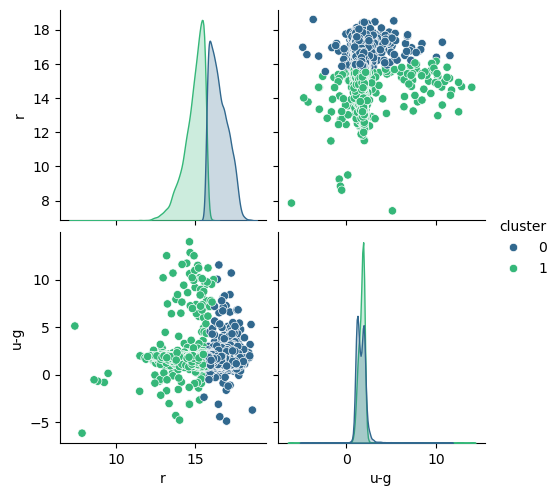

In [18]:
#visualizamos clusters
sns.pairplot(rs, hue='cluster', palette='viridis')

In [19]:
new_gals = [12.1312,1.4123]

#predecimos el nuevo modelo con Kmeans para una posible nueva galaxia
new_gal = model_kmeans.predict([new_gals])
print('La nueva galaxia pertenece al cluster:', new_gal)

La nueva galaxia pertenece al cluster: [1]


In [20]:
import random

# Generate random pairs of numbers
random_pairs = []
for _ in range(10):
    u_g = random.uniform(0.1, 3)
    r = random.uniform(10, 18)
    random_pairs.append((u_g, r))

# Print the random pairs
print(random_pairs)
for new_gals in random_pairs:
    new_gal = model_kmeans.predict([new_gals])
    print('La nueva galaxia pertenece al cluster:', new_gal)

[(2.1350586004836276, 13.535868982878625), (0.22984775619562833, 13.195977761220995), (2.654935820918396, 11.895611822507064), (2.726037298237726, 12.212404672497401), (0.48899097329643115, 10.354126232236876), (2.575082736464211, 14.316217118739555), (2.207730235271758, 12.45468138531641), (2.3082674504341605, 17.94516412306409), (0.29045016214926267, 10.954746050039471), (0.7600503799144478, 10.130982343642737)]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]
La nueva galaxia pertenece al cluster: [1]


In [21]:
model_kmeans = KMeans(n_clusters=4)

model_kmeans.fit(rs)

KMeans(n_clusters=4)

In [22]:
rs['cluster'] = model_kmeans.labels_
rs.head(10)

,r,u-g,cluster
0,14.62853,2.07691,0
1,15.64660,2.01194,0
2,15.63511,1.41884,0
3,15.14973,1.36330,0
4,16.00226,1.30201,1
5,16.53152,1.43712,1
6,16.80712,1.85519,3
7,13.99056,1.90788,0
8,13.56447,1.86815,0
9,16.71310,1.83532,3


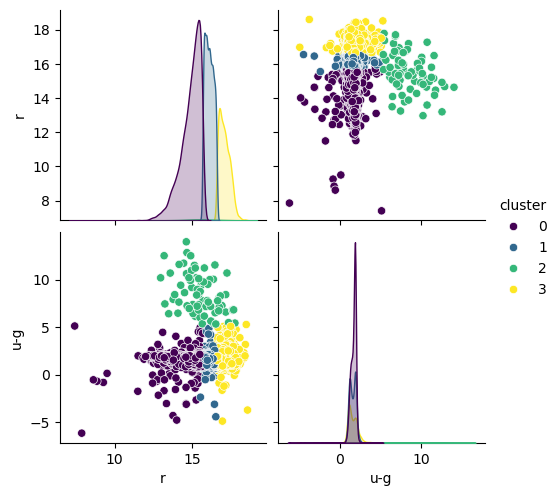

In [23]:
#visualizamos clusters
sns.pairplot(rs, hue='cluster', palette='viridis')

KNN MODEL

In [24]:
data = all_gals.copy().drop(['objid', 'nvote', 'spiral', 'uncertain', 'ra', 'dec'], axis=1)
data

,elliptical,petror90_r,expAB_r,u,g,r,i,u-g
0,1,13.36310,0.923567,17.60677,15.52986,14.62853,14.21786,2.07691
1,1,11.13560,0.729229,18.60427,16.59233,15.64660,15.23424,2.01194
2,0,10.64184,0.519332,17.71102,16.29218,15.63511,15.30861,1.41884
3,0,10.56850,0.542142,17.14548,15.78218,15.14973,14.77505,1.36330
4,0,14.08793,0.193187,17.85771,16.55570,16.00226,15.70330,1.30201
...,...,...,...,...,...,...,...,...
12282,0,10.59094,0.971643,18.31974,16.78312,15.99764,15.62374,1.53662
12283,0,15.64854,0.349454,17.80250,16.02506,15.23510,14.80043,1.77744
12284,0,10.92307,0.285187,19.20432,18.03366,17.58185,17.37344,1.17066
12285,1,10.64187,0.559680,18.62956,16.47706,15.51064,15.11258,2.15250


In [25]:
#Variables
X = data.iloc[:, 1:8]# 555x11
#Etiqueta
Y = data.iloc[:, 0] #

In [26]:
# Divide el conjunto de datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.1,random_state=42)
# Normaliza los datos para que todas las características tengan una escala similar
scaler = MinMaxScaler(feature_range=(0,1)) # [0, 1]
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [27]:
# Definir el modelo
knn = KNeighborsClassifier()

# Definir el espacio de hiperparámetros a buscar
param_grid = {
    'n_neighbors': [1,2,3,4, 5, 7, 9, 11, 13],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

In [28]:
# Configurar GridSearchCV
grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, cv=2, n_jobs=-1, scoring='accuracy')

# Ejecutar GridSearchCV para encontrar la mejor combinación de hiperparámetros
grid_search.fit(X_train, y_train)

# Imprimir los mejores hiperparámetros encontrados
best_params = grid_search.best_params_
print("Best parameters found: ", best_params)

Best parameters found:  {'metric': 'manhattan', 'n_neighbors': 13, 'weights': 'distance'}


In [29]:
# Crea y entrena el modelo K-NN

model = KNeighborsClassifier(
    n_neighbors=best_params['n_neighbors'],
    weights=best_params['weights'],
    metric=best_params['metric']
)
model.fit(X_train, y_train)
# Realiza predicciones usando el conjunto de prueba
y_pred = model.predict(X_test)
# Convierte las probabilidades en etiquetas binarias (0 o 1)
y_pred = (y_pred > 0.5)

              precision    recall  f1-score   support

           0       0.93      0.88      0.90       928
           1       0.68      0.79      0.73       301

    accuracy                           0.86      1229
   macro avg       0.80      0.83      0.82      1229
weighted avg       0.87      0.86      0.86      1229

confusion matrix: 
 [[815 113]
 [ 63 238]]


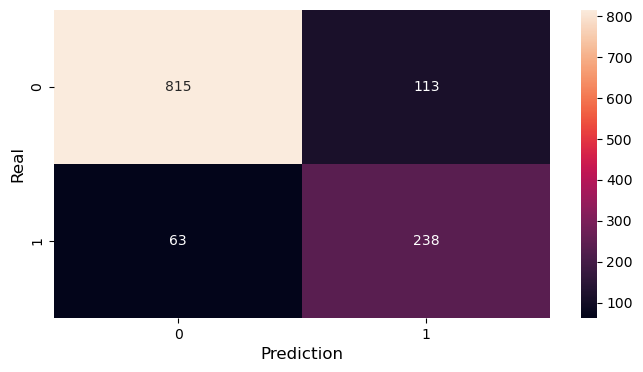

In [30]:
# Muestra el informe de evaluación del modelo entrenado
print(classification_report(y_test, y_pred))
# Matriz de confusión:
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix: \n", cm)
# gráfica de la CM
plt.figure(figsize = (8,4))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction', fontsize = 12)
plt.ylabel('Real', fontsize = 12)
plt.show()

In [31]:
# Exactitud:

acc = accuracy_score(y_test, y_pred)
print("accuracy: ", acc)
# Sensibilidad:
recall = recall_score(y_test, y_pred)
print("recall: ", recall)
# Precisión:
precision = precision_score(y_test, y_pred)
print("precision: ", precision)
# Especificidad
# 'specificity' is just a special case of 'recall'.
# specificity is the recall of the negative class
specificity = recall_score(y_test, y_pred, pos_label=0)
print("specificity: ", specificity)
# Puntuación F1:
f1 = f1_score(y_test, y_pred)
print("f1 score: ", f1)

accuracy:  0.8567941415785191
recall:  0.7906976744186046
precision:  0.6780626780626781
specificity:  0.8782327586206896
f1 score:  0.7300613496932515


auc:  0.8344652165196471


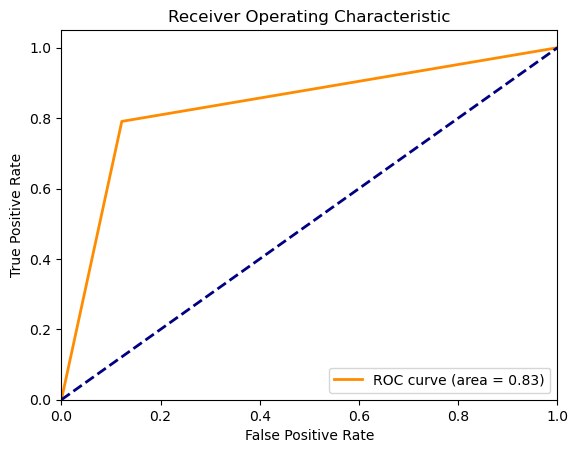

R2:  0.22562721961278487


In [32]:
# Área bajo la curva:
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, y_pred)
print("auc: ", auc)

# Curva ROC
from sklearn.metrics import roc_curve

plt.figure()
lw = 2
plt.plot(roc_curve(y_test, y_pred)[0], roc_curve(y_test, y_pred)[1],
color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' %auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# R Score (R^2 coefficient of determination)
from sklearn.metrics import r2_score
R = r2_score(y_test, y_pred)
print("R2: ", R)

In [33]:
X_test[:,0]

array([0.009657  , 0.00641515, 0.01463532, ..., 0.00234805, 0.00574663,
       0.00996277])

ANN MODEL

In [38]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam

# Crea y entrena el modelo RNA
model = Sequential()
model.add(Dense(50, activation='tanh', input_dim=8))
model.add(Dropout(0.1))
model.add(Dense(1, activation='sigmoid'))
model.summary()

opt = Adam(learning_rate=1e-2) # by default lr=1e-3
model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])
# Mostrar el resumen del modelo
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 50)             │           450 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 501 (1.96 KB)

 Trainable params: 501 (1.96 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 50)             │           450 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 501 (1.96 KB)

 Trainable params: 501 (1.96 KB)

 Non-trainable params: 0 (0.00 B)

In [40]:
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

print("Type of X_train:", type(X_train))
print("Type of y_train:", type(y_train))
print("Type of X_test:", type(X_test))
print("Type of y_test:", type(y_test))


Shape of X_train: (11058, 7)
Shape of y_train: (11058,)
Shape of X_test: (1229, 7)
Shape of y_test: (1229,)
Type of X_train: <class 'numpy.ndarray'>
Type of y_train: <class 'pandas.core.series.Series'>
Type of X_test: <class 'numpy.ndarray'>
Type of y_test: <class 'pandas.core.series.Series'>


In [41]:
# Crea y entrena el modelo RNA
model = Sequential()
model.add(Dense(50, activation='tanh', input_dim=7))  # Cambiar input_dim a 7
model.add(Dropout(0.1))
model.add(Dense(1, activation='sigmoid'))
model.summary()

opt = Adam(learning_rate=1e-2)  # Cambiar 'lr' a 'learning_rate'
model.compile(loss='binary_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])
# Mostrar el resumen del modelo
model.summary()

# Convertir y_train y y_test a numpy arrays
y_train = np.array(y_train)
y_test = np.array(y_test)

# Entrenar el modelo
history = model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1,
                    validation_data=(X_test, y_test))

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 50)             │           400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 451 (1.76 KB)

 Trainable params: 451 (1.76 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_6 (Dense)                 │ (None, 50)             │           400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 451 (1.76 KB)

 Trainable params: 451 (1.76 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.7483 - loss: 0.4872 - val_accuracy: 0.7600 - val_loss: 0.4418
Epoch 2/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 569us/step - accuracy: 0.7776 - loss: 0.4297 - val_accuracy: 0.7860 - val_loss: 0.4485
Epoch 3/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 586us/step - accuracy: 0.7910 - loss: 0.4097 - val_accuracy: 0.8039 - val_loss: 0.4267
Epoch 4/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 588us/step - accuracy: 0.8079 - loss: 0.3954 - val_accuracy: 0.7966 - val_loss: 0.4211
Epoch 5/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 653us/step - accuracy: 0.7974 - loss: 0.4021 - val_accuracy: 0.8015 - val_loss: 0.4439
Epoch 6/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 624us/step - accuracy: 0.8091 - loss: 0.3924 - val_accuracy: 0.8104 - val_loss: 0.4236
Epoch 7/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 736us/step - accuracy: 0.8067 - loss: 0.3963 - val_accuracy: 0.8015 - val_loss: 0.4194
Epoch 8/100
346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 617us/step - accuracy: 0.8082 - loss: 0.3

In [42]:
# Evaluar el modelo en el conjunto de prueba
# Realiza predicciones usando el conjunto de prueba
y_pred = model.predict(X_test)
# Convierte las probabilidades en etiquetas binarias (0 o 1)
y_pred = (y_pred > 0.5).astype("int32")
# Muestra el informe de evaluación del modelo entrenado
print(classification_report(y_test, y_pred))

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step
              precision    recall  f1-score   support

           0       0.86      0.94      0.89       928
           1       0.72      0.51      0.60       301

    accuracy                           0.83      1229
   macro avg       0.79      0.73      0.75      1229
weighted avg       0.82      0.83      0.82      1229



confusion matrix: 
 [[868  60]
 [146 155]]


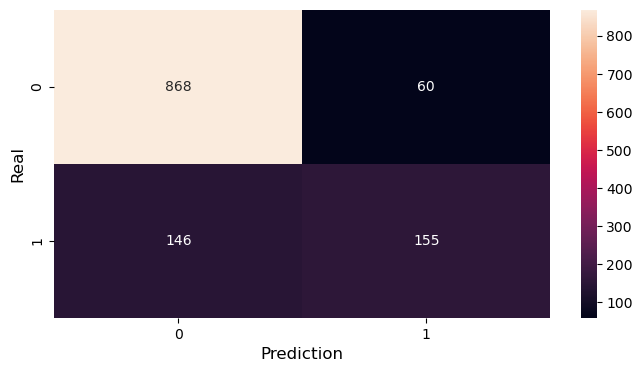

In [43]:
# Matriz de confusión:
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix: \n", cm)

# gráfica de la CM
plt.figure(figsize = (8,4))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction', fontsize = 12)
plt.ylabel('Real', fontsize = 12)
plt.show()

In [44]:
# Exactitud:
acc = accuracy_score(y_test, y_pred)
print("accuracy: ", acc)
# Sensibilidad:
recall = recall_score(y_test, y_pred)
print("recall: ", recall)
# Precisión:
precision = precision_score(y_test, y_pred)
print("precision: ", precision)
# Especificidad
# 'specificity' is just a special case of 'recall'.
# specificity is the recall of the negative class
specificity = recall_score(y_test, y_pred, pos_label=0)
print("specificity: ", specificity)
# Puntuación F1:
f1 = f1_score(y_test, y_pred)
print("f1 score: ", f1)

accuracy:  0.8323840520748577
recall:  0.5149501661129569
precision:  0.7209302325581395
specificity:  0.9353448275862069
f1 score:  0.6007751937984496


auc:  0.7251474968495819


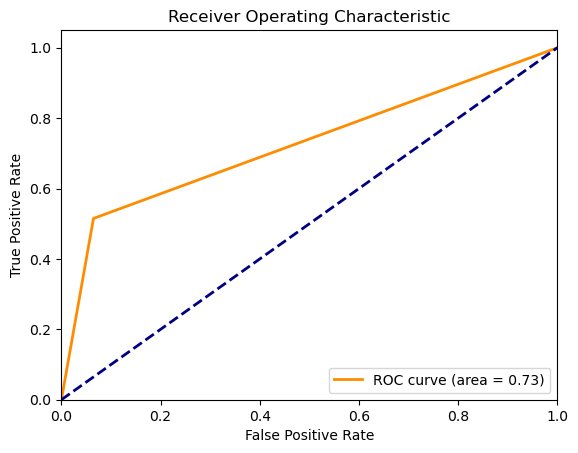

R2:  0.09363185931950957


In [45]:
# Área bajo la curva:
auc = roc_auc_score(y_test, y_pred)
print("auc: ", auc)
# Curva ROC
plt.figure()
lw = 2
plt.plot(roc_curve(y_test, y_pred)[0], roc_curve(y_test, y_pred)[1],
color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' %auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()
# R Score (R^2 coefficient of determination)
from sklearn.metrics import r2_score
R = r2_score(y_test, y_pred)
print("R2: ", R)

LOGISTIC REGRESSION MODEL

In [46]:
# Definir el modelo
log_reg = LogisticRegression(random_state=42, max_iter=10000)

# Definir el espacio de hiperparámetros a buscar
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.01, 0.1, 1, 10, 100],  # Regularización inversa
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'l1_ratio': [None, 0.25, 0.5, 0.75]  # Sólo se usa si penalty es 'elasticnet'
}

In [47]:
# Crea y entrena el modelo de regresión logistica
model = LogisticRegression(multi_class='auto', solver='lbfgs', max_iter=100)
model.fit(X_train, y_train)

LogisticRegression()

In [48]:
print("Coeficientes de modelo:")
print(model.coef_)
print("Intercepto de modelo:")
print(model.intercept_)
# Realiza predicciones usando el conjunto de prueba
y_pred = model.predict(X_test)
# Convierte las probabilidades en etiquetas binarias (0 o 1)
y_pred = (y_pred > 0.5)

Coeficientes de modelo:
[[-3.89538203  5.74143114 10.63886308  6.82095848 -7.99283568 -9.43535713
   4.64121218]]
Intercepto de modelo:
[-5.15938277]


              precision    recall  f1-score   support

           0       0.82      0.92      0.87       928
           1       0.60      0.38      0.47       301

    accuracy                           0.79      1229
   macro avg       0.71      0.65      0.67      1229
weighted avg       0.77      0.79      0.77      1229

confusion matrix: 
 [[850  78]
 [186 115]]


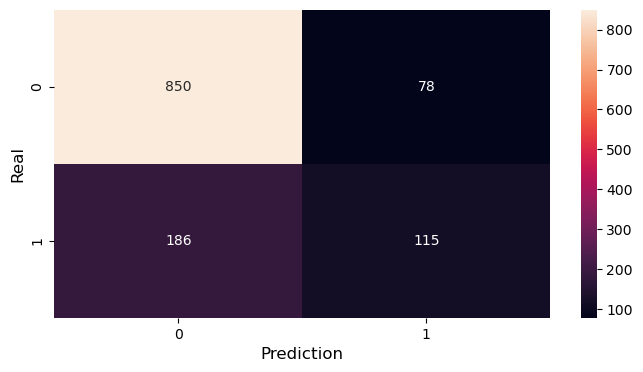

In [49]:
# Muestra el informe de evaluación del modelo entrenado
print(classification_report(y_test, y_pred))
# Matriz de confusión:
cm = confusion_matrix(y_test, y_pred)
print("confusion matrix: \n", cm)
# gráfica de la CM
plt.figure(figsize = (8,4))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction', fontsize = 12)
plt.ylabel('Real', fontsize = 12)
plt.show()

In [50]:
# Exactitud:
acc = accuracy_score(y_test, y_pred)
print("accuracy: ", acc)
# Sensibilidad:
recall = recall_score(y_test, y_pred)
print("recall: ", recall)
# Precisión:
precision = precision_score(y_test, y_pred)
print("precision: ", precision)
# Especificidad
# 'specificity' is just a special case of 'recall'.
# specificity is the recall of the negative class
specificity = recall_score(y_test, y_pred, pos_label=0)
print("specificity: ", specificity)
# Puntuación F1:
f1 = f1_score(y_test, y_pred)
print("f1 score: ", f1)
# Área bajo la curva:
auc = roc_auc_score(y_test, y_pred)
print("auc: ", auc)

accuracy:  0.7851912123677787
recall:  0.38205980066445183
precision:  0.5958549222797928
specificity:  0.915948275862069
f1 score:  0.46558704453441296
auc:  0.6490040382632604


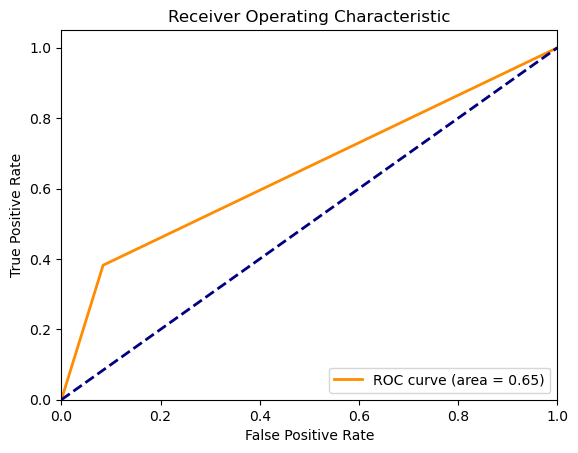

R2:  -0.1615591705808226


In [51]:
# Curva ROC
plt.figure()
lw = 2
plt.plot(roc_curve(y_test, y_pred)[0], roc_curve(y_test, y_pred)[1],
color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' %auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()
# R Score (R^2 coefficient of determination)
R = r2_score(y_test, y_pred)
print("R2: ", R)

DESITION TREE MODEL

In [52]:
# Crea y entrena el modelo de árbol de decisión
model = DecisionTreeClassifier(max_depth=4, criterion = 'gini')
model.fit(X_train, y_train)
# Realiza predicciones usando el conjunto de prueba
y_pred = model.predict(X_test)
# Convierte las probabilidades en etiquetas binarias (0 o 1)
y_pred = (y_pred > 0.5)

              precision    recall  f1-score   support

           0       0.93      0.85      0.89       928
           1       0.64      0.80      0.71       301

    accuracy                           0.84      1229
   macro avg       0.79      0.83      0.80      1229
weighted avg       0.86      0.84      0.85      1229

confusion matrix: 
 [[793 135]
 [ 60 241]]


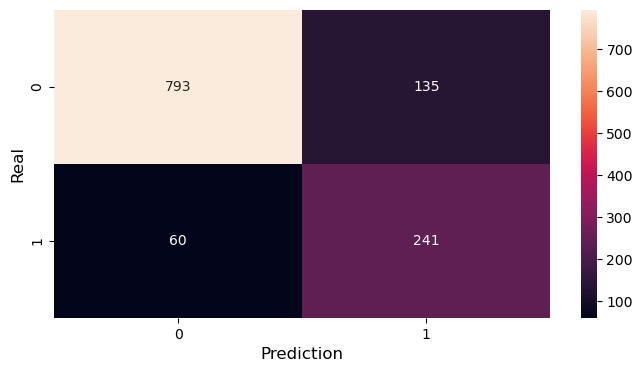

In [53]:
# Muestra el informe de evaluación del modelo entrenado
print(classification_report(y_test, y_pred))
# Matriz de confusión:
cm = confusion_matrix(y_test, y_pred)
print ("confusion matrix: \n", cm)
# gráfica de la CM
plt.figure(figsize = (8,4))
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Prediction', fontsize = 12)
plt.ylabel('Real', fontsize = 12)
plt.show()

In [54]:
# Exactitud:
acc = accuracy_score(y_test, y_pred)
print("accuracy: ", acc)
# Sensibilidad:
recall = recall_score(y_test, y_pred)
print("recall: ", recall)
# Precisión:
precision = precision_score(y_test, y_pred)
print("precision: ", precision)
# Especificidad
# 'specificity' is just a special case of 'recall'.
# specificity is the recall of the negative class
specificity = recall_score(y_test, y_pred, pos_label=0)
print("specificity: ", specificity)
#Puntuación F1:
f1 = f1_score(y_test, y_pred)
print("f1 score: ", f1)
# Área bajo la curva:
auc = roc_auc_score(y_test, y_pred)
print("auc: ", auc)

accuracy:  0.8413344182262001
recall:  0.8006644518272426
precision:  0.6409574468085106
specificity:  0.8545258620689655
f1 score:  0.7119645494830132
auc:  0.827595156948104


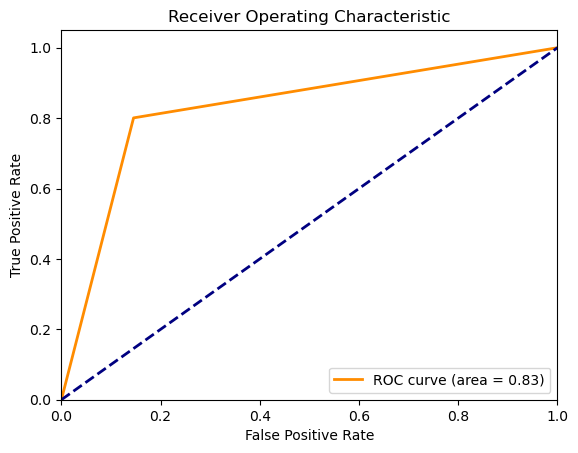

R2:  0.14203015809371056


In [55]:
# Curva ROC
plt.figure()
lw = 2
plt.plot(roc_curve(y_test, y_pred)[0], roc_curve(y_test, y_pred)[1],
color='darkorange',lw=lw, label='ROC curve (area = %0.2f)' %auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()
# R Score (R^2 coefficient of determination)
R = r2_score(y_test, y_pred)
print("R2: ", R)

CHECK GALAXIES

In [56]:

def show_galaxy_images(my_galaxies):
    #plot a random subset of 16 galaxies
    # set thumbnail parameters
    width=200           # image width
    height=200          # height
    pixelsize=0.396     # image scale
    plt.figure(figsize=(15, 15))   # display in a 4x4 grid
    subPlotNum = 1

    i = 0
    nGalaxies = 16 #Total number of galaxies to plot
    ind = np.random.randint(0,len(my_galaxies), nGalaxies) #randomly selected rows
    count=0
    for i in ind:           # iterate through the randomly selected rows in the DataFrame
        count=count+1
        print('Getting image '+str(count)+' of '+str(nGalaxies)+'...')
        if (count == nGalaxies):
            print('Plotting images...')
        scale= 2 * my_galaxies.iloc[i]['petror90_r']/pixelsize/width

        # Access the 'ra' and 'dec' values for the current row using .loc[]
        ra = my_galaxies.loc[i, 'ra']
        dec = my_galaxies.loc[i, 'dec']
        pos = coords.SkyCoord(ra, dec, unit=u.deg, frame='icrs')

        cutoutbaseurl = 'http://skyservice.pha.jhu.edu/DR12/ImgCutout/getjpeg.aspx'
        query_string = urlencode(dict(ra=ra, dec=dec, width=width, height=height, scale=scale))
        url = cutoutbaseurl + '?' + query_string

        # this downloads the image
        image_name = 'cutout_'+str(i)+'.jpg'
        urlretrieve(url, image_name)

        # Display the image
        img = imread(image_name)


        plt.subplot(4,4,subPlotNum)
        subPlotNum += 1
        plt.imshow(img)                               # show images in grid
        plt.title(i)

Getting image 1 of 16...
Getting image 2 of 16...
Getting image 3 of 16...
Getting image 4 of 16...
Getting image 5 of 16...
Getting image 6 of 16...
Getting image 7 of 16...
Getting image 8 of 16...
Getting image 9 of 16...
Getting image 10 of 16...
Getting image 11 of 16...
Getting image 12 of 16...
Getting image 13 of 16...
Getting image 14 of 16...
Getting image 15 of 16...
Getting image 16 of 16...
Plotting images...


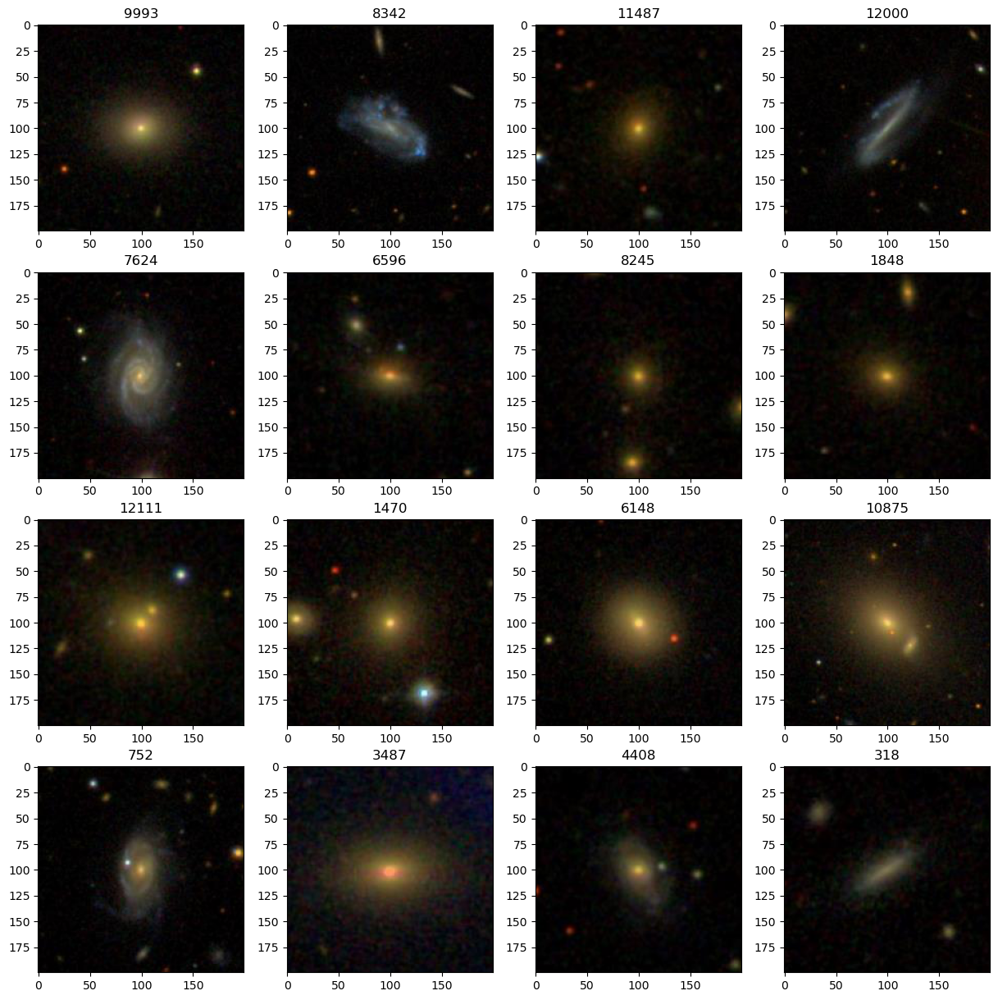

In [57]:
show_galaxy_images(all_gals)